# EcoCrop clustering with agglomerative hierarchical clustering

Starting with cleaned data save in
```
cropbasics_clean_df_file = '../data/agricultural/EcoCrop/_data/cropbasics_clean_df.pkl'
```

## load libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import seaborn as sns
import networkx as nx
import warnings
import gower

from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list, ward
from scipy.spatial.distance import pdist
from scipy.sparse import csr_matrix
from scipy.cluster.hierarchy import fcluster
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score, calinski_harabasz_score
from collections import defaultdict

from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

## load data

In [121]:
cropbasics_clean_df_file = '../data/agricultural/EcoCrop/generated_data/cropbasics_clean_df.pkl'
cropbasics_clean_df = pd.read_pickle(cropbasics_clean_df_file)
cropbasics_clean_df.head(3)

,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,Level.of.mechanization,Labour.intensity,cycle_min,cycle_max,use.main,use.detailed,use.part,datasheet_url,genus,species
0,289,Abelmoschus esculentus,herb,erect,annual,single stem,vegetables,grown on large scale,20.0,30.0,...,Level of mechanization,Labour intensity,50.0,180.0,food & beverage,vitamins,fruits,http://ecocrop.fao.org/ecocrop/srv/en/dataShee...,Abelmoschus,esculentus
1,290,Abelmoschus manihot,shrub,erect,"annual, perennial","deciduous, multi stem","vegetables, ornamentals/turf, medicinals & aro...",grown on small scale,22.0,30.0,...,Level of mechanization,Labour intensity,365.0,365.0,food & beverage,vitamins,leaves,http://ecocrop.fao.org/ecocrop/srv/en/dataShee...,Abelmoschus,manihot
2,291,Abelmoschus moschatus,"herb, sub-shrub",prostrate/procumbent/semi-erect,"annual, biennial, perennial","deciduous, multi stem","ornamentals/turf, medicinals & aromatic",grown on large scale,20.0,30.0,...,Level of mechanization,Labour intensity,0.0,0.0,environmental,ornamental/turf,entire plant,http://ecocrop.fao.org/ecocrop/srv/en/dataShee...,Abelmoschus,moschatus


## select, encode, and scale data

### select columns for features

In [3]:
# impute_numerics['temp_opt_min'].dtype
# impute_numerics['temp_opt_min'].unique()

for column in cropbasics_clean_df.columns:
    print()
    print(column)
    print(cropbasics_clean_df[column].unique())


crop_code
[   289    290    291 ... 400002 400003 400004]

genus_species
['Abelmoschus esculentus' 'Abelmoschus manihot' 'Abelmoschus moschatus'
 ... 'Prosopis affinis' 'Vicia dasycarpa' 'Camelina sativa']

Life.form
['herb' 'shrub' 'herb, sub-shrub' 'tree' 'shrub, tree' 'grass'
 'herb, vine' 'herb, vine, sub-shrub' 'sub-shrub' 'herb, shrub'
 'vine, shrub' 'vine' 'herb, shrub, tree' 'herb, sub-shrub, shrub'
 'vine, shrub, tree' 'other' 'vine, sub-shrub' 'sub-shrub, shrub'
 'vine, tree']

Habit
['erect' 'prostrate/procumbent/semi-erect'
 'erect, acaulescent (or rosette plants)' 'climber/scrambler/scadent'
 'acaulescent (or rosette plants)'
 'erect, prostrate/procumbent/semi-erect'
 'erect, climber/scrambler/scadent'
 'prostrate/procumbent/semi-erect, climber/scrambler/scadent'
 'prostrate/procumbent/semi-erect, acaulescent (or rosette plants)'
 'erect, prostrate/procumbent/semi-erect, climber/scrambler/scadent']

Life.span
['annual' 'annual, perennial' 'annual, biennial, perennial' 'pe

In [4]:
cropbasics_clean_df.columns

Index(['crop_code', 'genus_species', 'Life.form', 'Habit', 'Life.span',
       'Physiology', 'Category', 'Plant.attributes', 'temp_opt_min',
       'Temp_Opt_Max', 'Temp_Abs_Min', 'Temp_Abs_Max', 'Rain_Opt_Min',
       'Rain_Opt_Max', 'Rain_Abs_Min', 'Rain_Abs_Max', 'Lat_Opt_Min',
       'Lat_Opt_Max', 'Lat_Abs_Min', 'Lat_Abs_Max', 'Alt_Opt_Min',
       'Alt_Opt_Max', 'Alt_Abs_Min', 'Alt_Abs_Max', 'pH_Opt_Min', 'pH_Opt_Max',
       'pH_Abs_Min', 'pH_Abs_Max', 'Light_Opt_Min', 'Light_Opt_Max',
       'Light_Abs_Min', 'Light_Abs_Max', 'Depth_Opt', 'Depth_Abs',
       'Texture_Ops', 'Texture_Abs', 'Fertility_Ops', 'Fertility_Abs',
       'Al_Toxicity_Opt', 'Al_Toxicity_Abs', 'Salinity_Ops', 'Salinity_Abs',
       'drainage_opt', 'drainage_abs', 'Climate.Zone', 'photoperiod',
       'Killing.temp..during.rest', 'Killing.temp..early.growth',
       'Abiotic.toler.', 'Abiotic.suscept.', 'Introduction.risks.',
       'Product..system', 'Cropping.system', 'Subsystem', 'Companion.species',
    

In [5]:
columns_to_keep = [
    # 'crop_code', 
    # 'species', 
    'Life.form', 
    'Habit', 
    'Life.span', 
    'Physiology',
    'Category', 
    'Plant.attributes', 
    'temp_opt_min', 
    'Temp_Opt_Max', 
    'Temp_Abs_Min', 
    'Temp_Abs_Max', 
    'Rain_Opt_Min', 
    'Rain_Opt_Max', 
    'Rain_Abs_Min', 
    'Rain_Abs_Max', 
    'Lat_Opt_Min', 
    'Lat_Opt_Max',  
    'Lat_Abs_Min', 
    'Lat_Abs_Max', 
    # 'Alt_Opt_Min', 
    # 'Alt_Opt_Max',  
    'Alt_Abs_Min', 
    'Alt_Abs_Max', 
    'pH_Opt_Min', 
    'pH_Opt_Max', 
    'pH_Abs_Min',  
    'pH_Abs_Max', 
    'Light_Opt_Min', 
    'Light_Opt_Max', 
    'Light_Abs_Min',  
    'Light_Abs_Max', 
    'Depth_Opt', 
    'Depth_Abs', 
    'Texture_Ops', 
    'Texture_Abs',    
    'Fertility_Ops', 
    'Fertility_Abs', 
    'Al_Toxicity_Opt', 
    'Al_Toxicity_Abs',  
    'Salinity_Ops', 
    'Salinity_Abs', 
    'drainage_opt', 
    'drainage_abs',
    'Climate.Zone', 
    'photoperiod', 
    'Killing.temp..during.rest', 
    'Killing.temp..early.growth', 
    'Abiotic.toler.', 
    'Abiotic.suscept.',     
    # 'Introduction.risks.', 
    # 'Product..system', 
    # 'Cropping.system', 
    # 'Subsystem', 
    # 'Companion.species', 
    # 'Level.of.mechanization',
    # 'Labour.intensity', 
    'cycle_min', 
    'cycle_max', 
    # 'use.main',
    # 'use.detailed', 
    # 'use.part', 
    # 'datasheet_url', 
    # 'genus',
    # 'species'
]

In [6]:
df_for_clustering = cropbasics_clean_df[columns_to_keep].copy()

In [7]:
df_for_clustering.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2568 entries, 0 to 2567
Data columns (total 48 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Life.form                   2568 non-null   object 
 1   Habit                       2568 non-null   object 
 2   Life.span                   2568 non-null   object 
 3   Physiology                  2568 non-null   object 
 4   Category                    2568 non-null   object 
 5   Plant.attributes            2568 non-null   object 
 6   temp_opt_min                2568 non-null   float64
 7   Temp_Opt_Max                2568 non-null   float64
 8   Temp_Abs_Min                2568 non-null   float64
 9   Temp_Abs_Max                2568 non-null   float64
 10  Rain_Opt_Min                2568 non-null   float64
 11  Rain_Opt_Max                2568 non-null   float64
 12  Rain_Abs_Min                2568 non-null   float64
 13  Rain_Abs_Max                2568 

### separate data types for distance calculation

categorical: 1-hot

numeric: apply StandardScaler()

In [8]:
categorical_data = df_for_clustering.select_dtypes(include='object')
numeric_data = df_for_clustering.select_dtypes(include='number')
# categorical_data
# numeric_data

### encode categoricals with 1-hot encoding

In [9]:
categorical_encoded = pd.get_dummies(categorical_data, drop_first=True)

In [10]:
categorical_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2568 entries, 0 to 2567
Columns: 783 entries, Life.form_herb to Abiotic.suscept._wind, flooding
dtypes: uint8(783)
memory usage: 1.9 MB


### scale numerical data

In [11]:
scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric_data)
numeric_scaled

array([[ 7.77805151e-03, -7.33891479e-04,  5.63155331e-02, ...,
         3.58760048e-17, -6.87059952e-01, -8.94825940e-02],
       [ 5.84852664e-02, -7.33891479e-04,  1.90976799e-01, ...,
         3.58760048e-17,  2.11789255e+00,  1.25725115e+00],
       [ 7.77805151e-03, -7.33891479e-04, -1.10150998e-02, ...,
         3.58760048e-17, -1.13229051e+00, -1.39981813e+00],
       ...,
       [ 3.31316589e-02,  2.25700439e-02,  6.30485963e-02, ...,
         3.58760048e-17, -1.13229051e+00, -1.39981813e+00],
       [-1.69697201e-01, -1.07984958e-01, -1.73220715e-01, ...,
         3.58760048e-17, -1.13229051e+00, -1.39981813e+00],
       [ 0.00000000e+00, -1.03490263e-16,  0.00000000e+00, ...,
         3.58760048e-17, -1.13229051e+00, -1.39981813e+00]])

### combine scaled numeric and encoded categorical features

In [12]:
combined_scaled_encoded = np.hstack((numeric_scaled, categorical_encoded.values))
combined_scaled_encoded

array([[ 7.77805151e-03, -7.33891479e-04,  5.63155331e-02, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 5.84852664e-02, -7.33891479e-04,  1.90976799e-01, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 7.77805151e-03, -7.33891479e-04, -1.10150998e-02, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 3.31316589e-02,  2.25700439e-02,  6.30485963e-02, ...,
         1.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-1.69697201e-01, -1.07984958e-01, -1.73220715e-01, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00, -1.03490263e-16,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

### use Gower's distance to calculate distance matrix of mixed data 

https://en.wikipedia.org/wiki/Gower%27s_distance

In statistics, Gower's distance between two mixed-type objects is a similarity measure that can handle different types of data within the same dataset and is particularly useful in cluster analysis or other multivariate statistical techniques. Data can be binary, ordinal, or continuous variables. It works by normalizing the differences between each pair of variables and then computing a weighted average of these differences. The distance was defined in 1971 by Gower[1] and it takes values between 0 and 1 with smaller values indicating lower similarity.

In [13]:
gower_matrix = gower.gower_matrix(combined_scaled_encoded)

## AgglomerativeClustering

In [133]:
agg_clust = AgglomerativeClustering(affinity='precomputed', linkage='average', distance_threshold=0, n_clusters=None)
agg_clust.fit(gower_matrix)

AgglomerativeClustering(affinity='precomputed', distance_threshold=0,
                        linkage='average', n_clusters=None)

### create linkage_matrix

In [134]:
def generate_linkage_matrix_from_agg_clust(agg_clust):
    # Create the counts of samples under each node (required for plotting the dendrogram)
    counts = np.zeros(agg_clust.children_.shape[0])
    n_samples = len(agg_clust.labels_)
    for i, merge in enumerate(agg_clust.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    
    # Create the linkage matrix
    linkage_matrix = np.column_stack([agg_clust.children_, agg_clust.distances_,
                                      counts]).astype(float)
    
    # Normalize distances to range from 0 to 1
    Z = linkage_matrix.copy()
    Z[:, 2] = Z[:, 2] / Z[:, 2].max()
    return Z

In [135]:
Z = generate_linkage_matrix_from_agg_clust(agg_clust)

### plot sample dendrogram

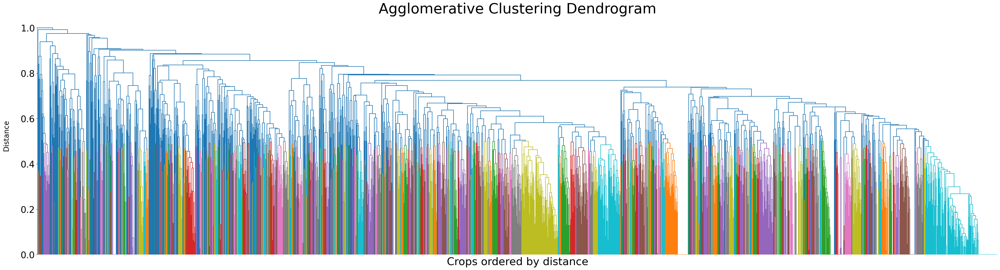

In [17]:
plt.figure(figsize=(48, 12))
# Plot the corresponding dendrogram
dendrogram(Z, 
           count_sort='ascending',
           # count_sort='descending',
           # distance_sort='ascending',
           # distance_sort='descending',
           no_labels=True, 
           color_threshold=0.5)

plt.title('Agglomerative Clustering Dendrogram', fontsize=40)
plt.xlabel('Crops ordered by distance', fontsize=30)
plt.ylabel('Distance', fontsize=20, labelpad=30)  # Offset the y-label

# Increase the font size of y-tick labels
plt.yticks(fontsize=25)

# Remove the plot frame
ax = plt.gca()  # Get the current axes
ax.spines['top'].set_visible(False)  # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine
ax.spines['bottom'].set_visible(False)  # Remove the bottom spine
ax.spines['left'].set_visible(False)  # Remove the bottom spine

plt.show()

In [18]:
D = dendrogram(Z,no_plot=True)

In [19]:
len(D['leaves'])

2568

In [20]:
D['leaves'][:10]

[44, 338, 838, 839, 1095, 2377, 1466, 829, 2121, 2128]

In [21]:
cutoff_distance = 0.5
cluster_labels = fcluster(Z, cutoff_distance, criterion='distance')
cluster_labels

array([502, 517, 287, ..., 327, 481, 483], dtype=int32)

In [22]:
len(cluster_labels)

2568

### evaluate clusters at different cutoffs

In [23]:
data = combined_scaled_encoded

# Initialize lists to store the results
n_clusters = []
avg_cluster_sizes = []
min_cluster_sizes = []
max_cluster_sizes = []
silhouette_scores = []
davies_bouldin_indices = []
calinski_harabasz_indices = []

clusters = defaultdict()

cutoffs = [0.1, 0.2, 0.3, 0.35, 0.4, 0.45, 0.5, 0.6, 0.7, 0.8]

for cutoff in cutoffs:
    cutoff_distance = cutoff
    cluster_labels = fcluster(Z, cutoff_distance, criterion='distance')

    unique_labels, counts = np.unique(cluster_labels, return_counts=True)
    n_clusters.append(len(unique_labels))
    
    average_cluster_size = np.mean(counts)
    avg_cluster_sizes.append(average_cluster_size)

    min_cluster_size = np.min(counts)
    min_cluster_sizes.append(min_cluster_size)
    
    max_cluster_size = np.max(counts)
    max_cluster_sizes.append(max_cluster_size)

    silhouette_avg = silhouette_score(gower_matrix, cluster_labels, metric='precomputed')
    silhouette_scores.append(silhouette_avg)
    
    davies_bouldin_index = davies_bouldin_score(data, cluster_labels)
    davies_bouldin_indices.append(davies_bouldin_index)

    calinski_harabasz_index = calinski_harabasz_score(data, cluster_labels)
    calinski_harabasz_indices.append(calinski_harabasz_index)

    clusters[f'clusters_at_cutoff_{cutoff}'] = cluster_labels

# Display results
results_df = pd.DataFrame({
    'Cutoff': cutoffs,
    'Number of Clusters': n_clusters,
    'Average Cluster Size': avg_cluster_sizes,
    'Min Cluster Size': min_cluster_sizes,
    'Max Cluster Size': max_cluster_sizes,
    'Silhouette Score': silhouette_scores,
    'Davies-Bouldin Index': davies_bouldin_indices,
    'Calinski-Harabasz Index': calinski_harabasz_indices
})

results_df

,Cutoff,Number of Clusters,Average Cluster Size,Min Cluster Size,Max Cluster Size,Silhouette Score,Davies-Bouldin Index,Calinski-Harabasz Index
0,0.10,2265,1.133775,1,55,0.127734,0.481030,35.727591
1,0.20,2074,1.238187,1,72,0.155399,0.570835,12.293670
2,0.30,1667,1.540492,1,134,0.178878,1.035814,5.487813
3,0.35,1402,1.831669,1,134,0.187542,1.221739,5.269915
4,0.40,1123,2.286732,1,158,0.189721,1.317615,5.312154
5,0.45,886,2.898420,1,191,0.172456,1.367290,5.594099
6,0.50,647,3.969088,1,193,0.158864,1.516359,6.000834
7,0.60,301,8.531561,1,335,0.090294,1.921775,7.775093
8,0.70,125,20.544000,1,775,0.032216,2.156152,10.898214
9,0.80,42,61.142857,1,1767,0.008067,2.395673,15.920718


In [24]:
normalized_results_df = results_df/results_df.max()
normalized_results_df['Number of Clusters'] = results_df['Number of Clusters']
normalized_results_df['Cutoff'] = results_df['Cutoff']
# normalized_results_df

In [25]:
norm_melt = normalized_results_df.melt(
    id_vars='Cutoff',
    value_vars=[
        # 'Actual Clusters',
        'Average Cluster Size',
        # 'Min Cluster Size', 
        # 'Max Cluster Size', 
        'Silhouette Score', 
        'Davies-Bouldin Index',
        'Calinski-Harabasz Index'
    ], 
    var_name="Metric", 
    value_name='Score'
)
# norm_melt

In [189]:
width = 800
height = 400

comparison_plot = alt.Chart(
    norm_melt,
    width=width,
    height=height,
).encode(
    x = 'Cutoff',
    y = alt.Y('Score:Q', axis=alt.Axis(title="Relative Score")),
    color = 'Metric:N'
).mark_line(point=True)
comparison_plot

alt.Chart(...)

In [27]:
def generate_metrics_plots(cutoffs, scores, title):
    
    plt.figure(figsize=(16, 8))
    plt.plot(cutoffs, scores, marker='o')
    plt.xlabel('Cutoff Distance')
    plt.ylabel(f'{title}')
    plt.title(f'{title} at Various Cutoff Distances')
    plt.grid(True)
    # Remove the plot frame
    ax = plt.gca()  # Get the current axes
    ax.spines['top'].set_visible(False)  # Remove the top spine
    ax.spines['right'].set_visible(False)  # Remove the right spine
    
    plt.show()

#### number of clusters

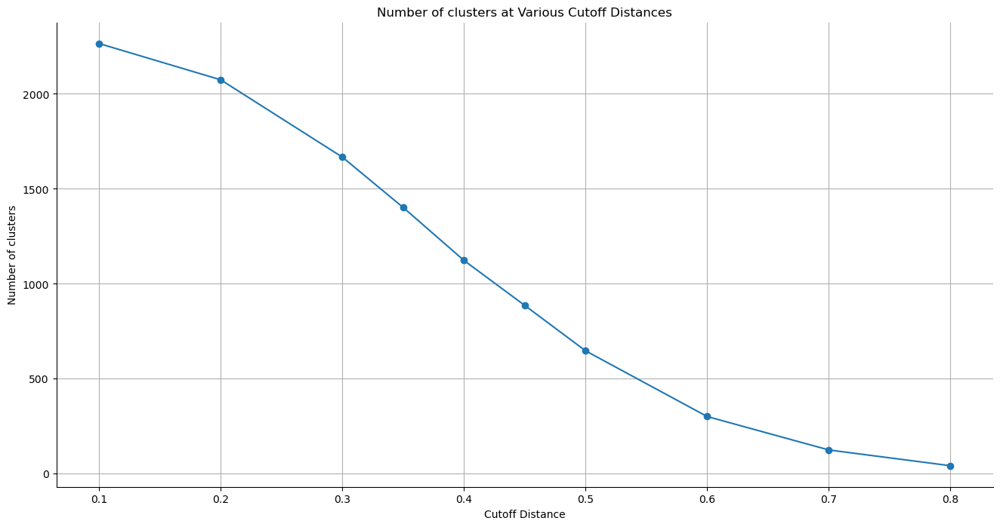

In [28]:
title = 'Number of clusters'
scores = n_clusters
generate_metrics_plots(cutoffs, scores, title)

In [29]:
n_clusters[4]

1123

#### average cluster size

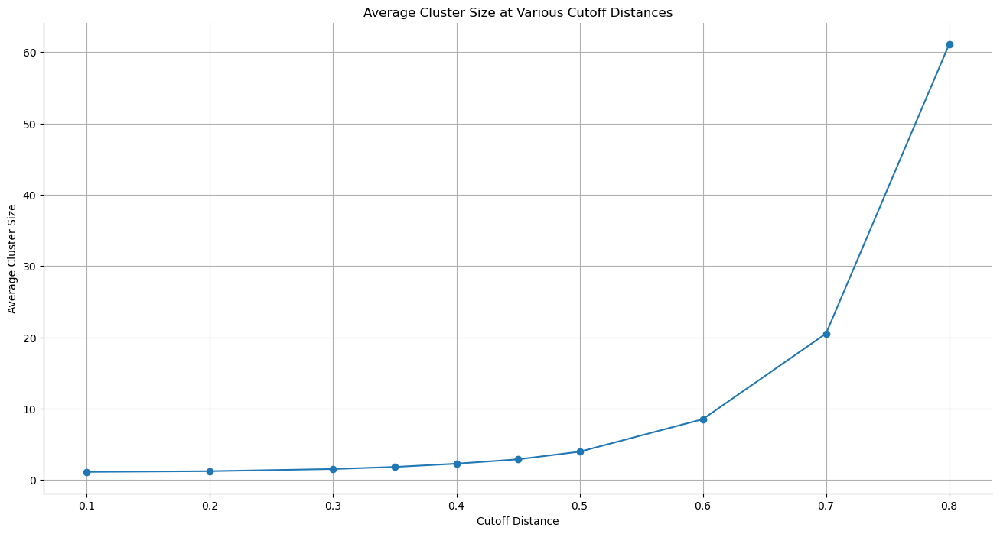

In [30]:
title = 'Average Cluster Size'
scores = avg_cluster_sizes
generate_metrics_plots(cutoffs, scores, title)

#### maximum cluster size

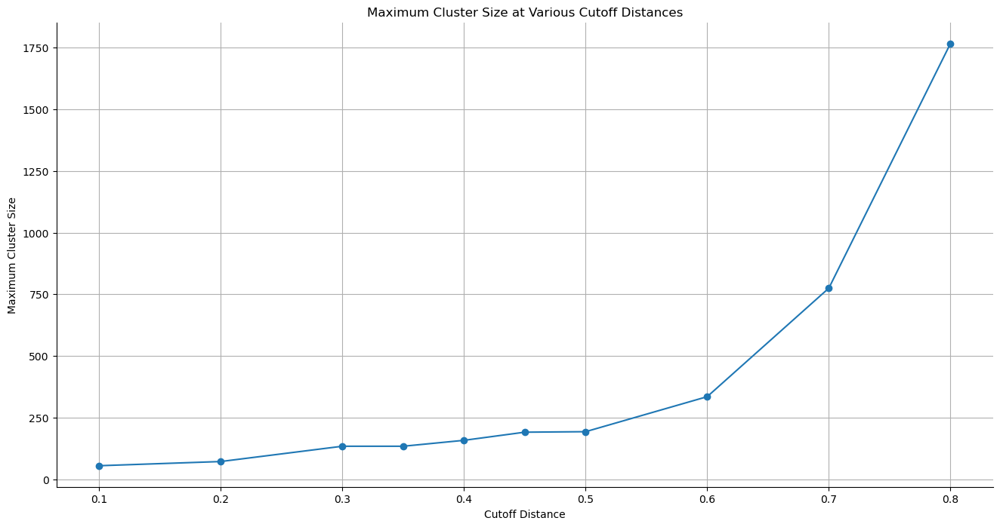

In [31]:
title = 'Maximum Cluster Size'
scores = max_cluster_sizes
generate_metrics_plots(cutoffs, scores, title)

#### minimum cluster size

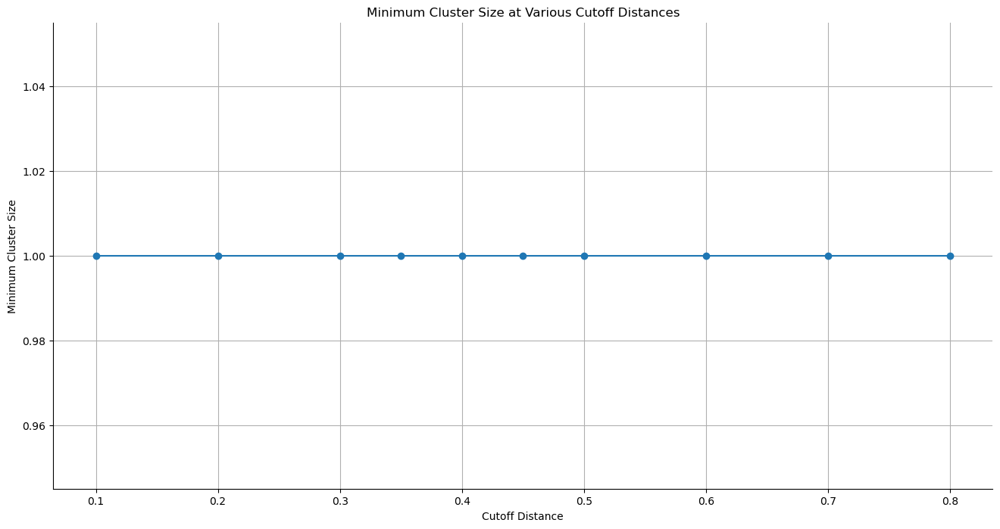

In [32]:
title = 'Minimum Cluster Size'
scores = min_cluster_sizes
generate_metrics_plots(cutoffs, scores, title)

#### Silhouette

The silhouette score measures how similar an object is to its own cluster compared to other clusters. The score ranges from -1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

- **High positive values** indicate that samples are well clustered.
- **Values near zero** suggest overlapping clusters.
- **Negative values** generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar.

Note that members of the same cluster do not necessarily have the same silhouette score. Silhouette scores measure how similar an individual data point is to its own cluster compared to other clusters, and this score can vary significantly within the same cluster depending on the data point's proximity to the cluster center and to other clusters.

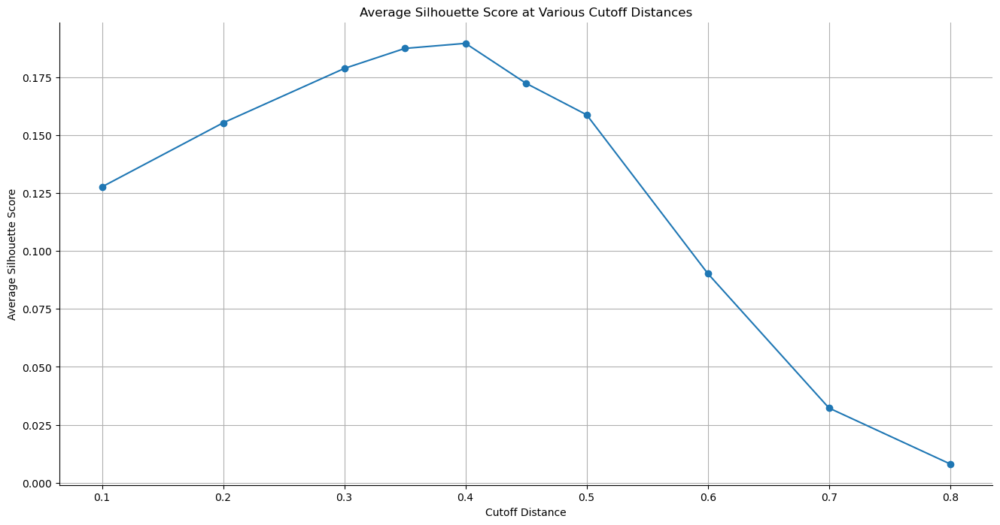

In [33]:
title = 'Average Silhouette Score'
scores = silhouette_scores
generate_metrics_plots(cutoffs, scores, title)

#### Davies-Bouldin

This index signifies the average 'similarity' between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves. A lower Davies-Bouldin index relates to a model with better separation between the clusters.

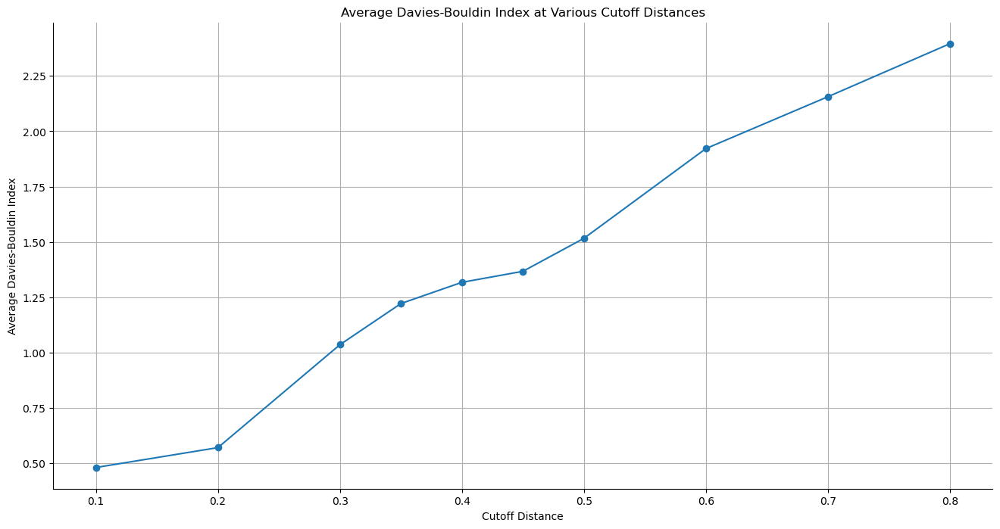

In [34]:
title = 'Average Davies-Bouldin Index'
scores = davies_bouldin_indices
generate_metrics_plots(cutoffs, scores, title)

#### Calinski-Harabasz Index 

This index is the ratio of the sum of between-clusters dispersion and of within-cluster dispersion for all clusters (where dispersion is defined as the sum of distances squared). Higher values generally mean that the clusters are dense and well separated, which is typically viewed as better.

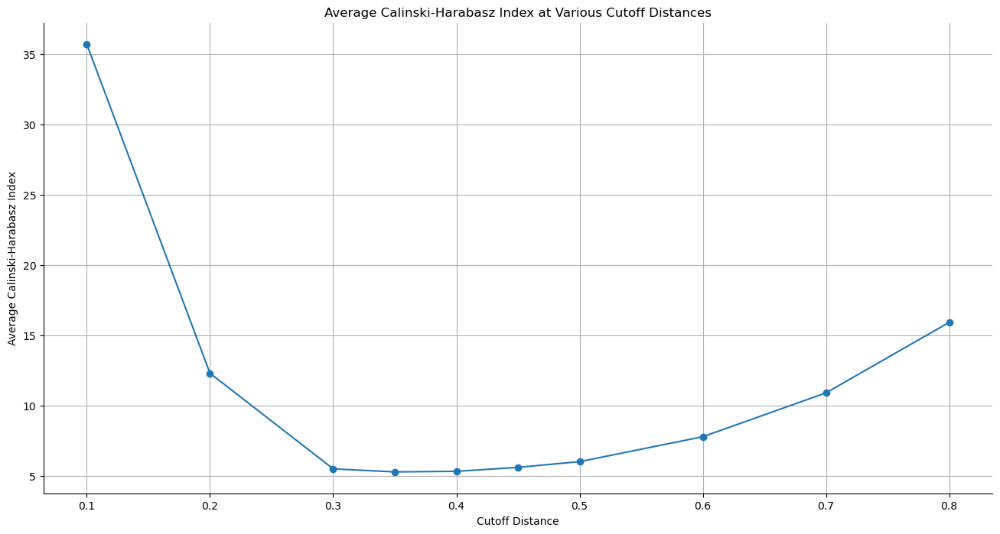

In [35]:
title = 'Average Calinski-Harabasz Index'
scores = calinski_harabasz_indices
generate_metrics_plots(cutoffs, scores, title)

#### comparison

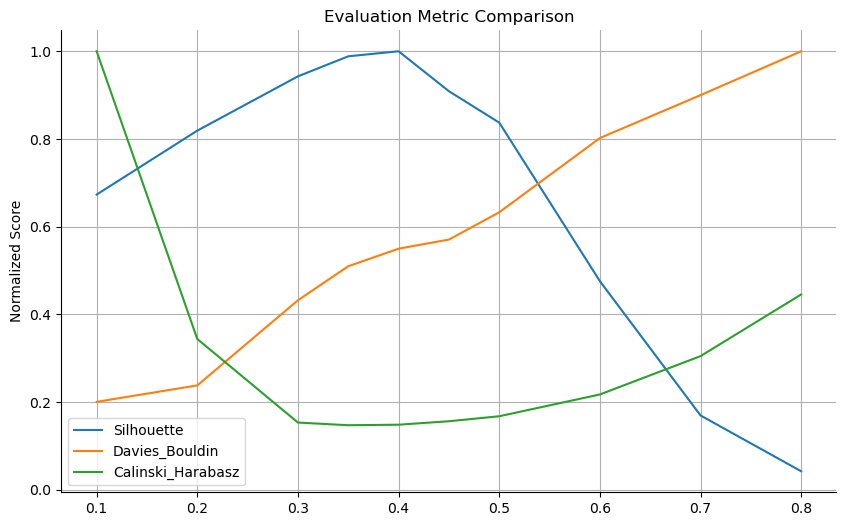

In [36]:
# Create a plot
plt.figure(figsize=(10, 6))

x = cutoffs
y1 = [score/np.max(silhouette_scores) for score in silhouette_scores]
y2 =[score/np.max(davies_bouldin_indices) for score in davies_bouldin_indices]
y3 = [score/np.max(calinski_harabasz_indices) for score in calinski_harabasz_indices]

label1 = 'Silhouette'
label2 = 'Davies_Bouldin'
label3 = 'Calinski_Harabasz'

# Plot each series on the same axis
plt.plot(x, y1, label=label1)
plt.plot(x, y2, label=label2)
plt.plot(x, y3, label=label3)

# Adding labels and title
# plt.xlabel('X axis')
plt.ylabel('Normalized Score')
plt.title('Evaluation Metric Comparison')

# Add a legend
plt.legend()

# Remove plot frame
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.grid(True)
# Show the plot
plt.show()

### add cluster_ids to dataframe

In [37]:
cluster_df = cropbasics_clean_df.copy()

In [38]:
# Add the cluster labels as new columns to the dataframe
for cutoff_key, labels in clusters.items():
    cluster_df[cutoff_key] = labels

In [39]:
cluster_df

,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
0,289,Abelmoschus esculentus,herb,erect,annual,single stem,vegetables,grown on large scale,20.000000,30.000000,...,1462,1354,1130,979,815,664,502,248,106,34
1,290,Abelmoschus manihot,shrub,erect,"annual, perennial","deciduous, multi stem","vegetables, ornamentals/turf, medicinals & aro...",grown on small scale,22.000000,30.000000,...,1519,1407,1175,1015,842,687,517,251,106,34
2,291,Abelmoschus moschatus,"herb, sub-shrub",prostrate/procumbent/semi-erect,"annual, biennial, perennial","deciduous, multi stem","ornamentals/turf, medicinals & aromatic",grown on large scale,20.000000,30.000000,...,614,593,531,484,421,363,287,161,78,29
3,295,Acacia auriculiformis,tree,erect,perennial,single stem,forest/wood,grown on large scale,24.000000,32.000000,...,936,902,785,709,608,511,398,218,103,34
4,297,Acacia farnesiana,tree,erect,perennial,single stem,"materials, ornamentals/turf, medicinals & arom...",grown on small scale,20.000000,32.000000,...,1928,1788,1486,1273,1043,834,614,287,115,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2563,400000,Chamaecrista rotundifolia,herb,prostrate/procumbent/semi-erect,"annual, perennial","deciduous, multi stem","forage/pasture, medicinals & aromatic",grown on small scale,20.000000,25.000000,...,313,305,271,254,234,209,170,113,64,27
2564,400001,Acacia polyacantha,"shrub, tree",erect,perennial,"single stem, multi stem","forest/wood, environmental",harvested from wild,20.163043,32.228261,...,906,876,769,696,598,505,395,217,102,34
2565,400002,Prosopis affinis,tree,erect,perennial,"deciduous, single stem, C3 photosynthesis",forest/wood,grown on small scale,21.000000,31.600000,...,719,694,616,557,486,414,327,184,87,33
2566,400003,Vicia dasycarpa,herb,climber/scrambler/scadent,annual,multi stem,forage/pasture,grown on large scale,13.000000,22.636364,...,1289,1227,1045,917,772,638,481,245,106,34


### examine cluster properties at relative cutoff of 0.4

#### examine content of a few clusters at a cutoff of 0.4

In [40]:
grouped = cluster_df.groupby('clusters_at_cutoff_0.4')

In [41]:
for cluster_id, group in grouped:
    if cluster_id <10:
        print()
        print(f"Cluster {cluster_id}")
        display(cluster_df[cluster_df['clusters_at_cutoff_0.4'] == cluster_id])


Cluster 1


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
838,3721,Betula pendula,tree,erect,perennial,"deciduous, single stem","medicinals & aromatic, forest/wood",grown on large scale,10.0,18.0,...,1,1,1,1,1,1,1,1,1,1
839,3722,Betula pubescens,tree,erect,perennial,"deciduous, single stem","vegetables, materials, ornamentals/turf, medic...",grown on large scale,10.0,18.0,...,2,1,1,1,1,1,1,1,1,1



Cluster 2


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
1095,5163,Cyperus longus,herb,erect,perennial,"evergreen, multi stem","vegetables, materials, ornamentals/turf, medic...",grown on small scale,14.0,32.0,...,3,2,2,2,2,2,2,2,1,1
2377,199708,Asclepias lanceolata,herb,erect,perennial,"evergreen, multi stem","materials, ornamentals/turf, medicinals & arom...",grown on small scale,12.0,30.0,...,4,3,3,2,2,2,2,2,1,1



Cluster 3


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
2121,12200,Alisma plantago-aquatica,herb,"erect, prostrate/procumbent/semi-erect",perennial,multi stem,"ornamentals/turf, medicinals & aromatic, weed",harvested from wild,8.0,18.0,...,5,4,4,3,3,3,3,3,2,1



Cluster 4


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
2128,12396,Aponogeton distachyos,herb,prostrate/procumbent/semi-erect,perennial,multi stem,"vegetables, ornamentals/turf, medicinals & aro...",grown on small scale,12.0,18.0,...,6,5,5,4,4,4,4,3,2,1



Cluster 5


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
2007,10628,Typha angustifolia,grass,erect,perennial,"deciduous, multi stem","vegetables, materials, medicinals & aromatic, ...",harvested from wild,10.0,24.0,...,7,6,6,5,5,5,5,4,2,1
2009,10633,Typha latifolia,grass,erect,perennial,"deciduous, multi stem","forage/pasture, vegetables, materials, medicin...","grown on small scale, harvested from wild",10.0,25.0,...,8,7,7,5,5,5,5,4,2,1
2191,17012,Sparganium erectum,grass,erect,perennial,"deciduous, multi stem","roots/tubers, vegetables, ornamentals/turf, me...",harvested from wild,12.0,24.0,...,9,8,8,6,5,5,5,4,2,1



Cluster 6


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
2008,10631,Typha domingensis,grass,erect,perennial,"evergreen, deciduous, multi stem","roots/tubers, vegetables, materials, medicinal...","grown on small scale, harvested from wild",16.0,28.0,...,10,9,9,7,6,5,5,4,2,1



Cluster 7


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
885,3988,Butomus umbellatus,herb,erect,perennial,deciduous,"roots/tubers, ornamentals/turf, weed",grown on small scale,15.0,24.0,...,11,10,10,8,7,6,5,4,2,1
1587,8002,Nuphar lutea,herb,prostrate/procumbent/semi-erect,perennial,"deciduous, multi stem","vegetables, ornamentals/turf, medicinals & aro...",grown on small scale,18.0,28.0,...,14,13,12,9,7,6,5,4,2,1
1849,9639,Scirpus lacustris,grass,erect,perennial,multi stem,"roots/tubers, vegetables, materials, ornamenta...","grown on small scale, harvested from wild",14.0,22.0,...,13,12,11,8,7,6,5,4,2,1
2398,225371,Peltandra sagittifolia,herb,erect,perennial,"deciduous, multi stem","vegetables, ornamentals/turf",grown on small scale,16.0,24.0,...,12,11,10,8,7,6,5,4,2,1



Cluster 8


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
1356,6458,Glyceria fluitans,grass,prostrate/procumbent/semi-erect,perennial,"deciduous, multi stem","cereals & pseudocereals, materials",grown on small scale,14.000000,26.000000,...,15,14,13,10,8,7,5,4,2,1
1588,8005,Nymphaea alba,herb,prostrate/procumbent/semi-erect,perennial,"deciduous, multi stem","roots/tubers, ornamentals/turf, medicinals & a...",harvested from wild,19.693217,30.050387,...,16,15,13,10,8,7,5,4,2,1



Cluster 9


,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
1586,8001,Nuphar advena,herb,erect,perennial,"deciduous, multi stem","vegetables, ornamentals/turf, medicinals & aro...",grown on small scale,14.0,30.0,...,20,19,16,12,9,8,5,4,2,1
1647,8409,Peltandra virginica,herb,erect,perennial,"deciduous, multi stem","vegetables, environmental",grown on small scale,12.0,24.0,...,23,22,18,12,9,8,5,4,2,1
2070,10994,Zizania latifolia,herb,erect,perennial,"deciduous, multi stem","vegetables, materials, medicinals & aromatic",grown on small scale,22.0,32.0,...,19,18,15,11,9,8,5,4,2,1
2134,12484,Asclepias incarnata,herb,erect,perennial,"single stem, multi stem","vegetables, materials, ornamentals/turf, medic...",grown on small scale,15.0,25.0,...,17,16,14,11,9,8,5,4,2,1
2179,16098,Pontederia cordata,herb,erect,perennial,"deciduous, multi stem","vegetables, ornamentals/turf, medicinals & aro...",grown on small scale,14.0,24.0,...,21,20,16,12,9,8,5,4,2,1
2197,17278,Trapa natans,herb,acaulescent (or rosette plants),annual,"deciduous, single stem","forage/pasture, fruits & nuts, ornamentals/tur...",grown on small scale,15.0,25.0,...,22,21,17,12,9,8,5,4,2,1
2234,18215,Marsilea quadrifolia,herb,erect,perennial,"deciduous, multi stem","forage/pasture, vegetables, ornamentals/turf, ...",grown on small scale,20.0,28.0,...,18,17,14,11,9,8,5,4,2,1


#### examine cluster content of a genus group

In [42]:
cluster_df[cluster_df['genus']=='Andropogon'][['genus_species','clusters_at_cutoff_0.1', 'clusters_at_cutoff_0.2', 'clusters_at_cutoff_0.3', 'clusters_at_cutoff_0.4']]

,genus_species,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.4
703,Andropogon gayanus,1031,989,863,663
704,Andropogon gerardii var. gerardii,1032,990,864,663
705,Andropogon hallii,1033,991,865,664
2452,Andropogon laxatus,1030,988,863,663
2495,Andropogon abyssinicus,1030,988,863,663
2496,Andropogon africanus,1030,988,863,663
2497,Andropogon amethystinus,1030,988,863,663
2498,Andropogon chrysostachyus,1030,988,863,663
2499,Andropogon greenwayi,1030,988,863,663
2500,Andropogon heterantherus,1030,988,863,663


In [43]:
cluster_df[cluster_df['clusters_at_cutoff_0.1'].isin(pd.Series(data=[1030]))][['genus_species', 'Life.form', 'Category', 'clusters_at_cutoff_0.1', 'clusters_at_cutoff_0.2', 'clusters_at_cutoff_0.3', 'clusters_at_cutoff_0.4']]

,genus_species,Life.form,Category,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.4
2452,Andropogon laxatus,grass,environmental,1030,988,863,663
2495,Andropogon abyssinicus,grass,environmental,1030,988,863,663
2496,Andropogon africanus,grass,environmental,1030,988,863,663
2497,Andropogon amethystinus,grass,environmental,1030,988,863,663
2498,Andropogon chrysostachyus,grass,environmental,1030,988,863,663
2499,Andropogon greenwayi,grass,environmental,1030,988,863,663
2500,Andropogon heterantherus,grass,environmental,1030,988,863,663


In [44]:
cluster_df[cluster_df['clusters_at_cutoff_0.1'].isin(pd.Series(data=[1030, 1031, 1032, 1033]))][['genus_species', 'Life.form', 'Category', 'clusters_at_cutoff_0.1', 'clusters_at_cutoff_0.2', 'clusters_at_cutoff_0.3', 'clusters_at_cutoff_0.4']]

,genus_species,Life.form,Category,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.4
703,Andropogon gayanus,grass,"forage/pasture, materials, environmental",1031,989,863,663
704,Andropogon gerardii var. gerardii,grass,forage/pasture,1032,990,864,663
705,Andropogon hallii,grass,environmental,1033,991,865,664
2452,Andropogon laxatus,grass,environmental,1030,988,863,663
2495,Andropogon abyssinicus,grass,environmental,1030,988,863,663
2496,Andropogon africanus,grass,environmental,1030,988,863,663
2497,Andropogon amethystinus,grass,environmental,1030,988,863,663
2498,Andropogon chrysostachyus,grass,environmental,1030,988,863,663
2499,Andropogon greenwayi,grass,environmental,1030,988,863,663
2500,Andropogon heterantherus,grass,environmental,1030,988,863,663


In [45]:
cluster_df[cluster_df['clusters_at_cutoff_0.4'].isin(pd.Series(data=[663, 664]))][['genus_species', 'Life.form', 'Category', 'clusters_at_cutoff_0.1', 'clusters_at_cutoff_0.2', 'clusters_at_cutoff_0.3', 'clusters_at_cutoff_0.4']]

,genus_species,Life.form,Category,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.4
703,Andropogon gayanus,grass,"forage/pasture, materials, environmental",1031,989,863,663
704,Andropogon gerardii var. gerardii,grass,forage/pasture,1032,990,864,663
705,Andropogon hallii,grass,environmental,1033,991,865,664
2452,Andropogon laxatus,grass,environmental,1030,988,863,663
2495,Andropogon abyssinicus,grass,environmental,1030,988,863,663
2496,Andropogon africanus,grass,environmental,1030,988,863,663
2497,Andropogon amethystinus,grass,environmental,1030,988,863,663
2498,Andropogon chrysostachyus,grass,environmental,1030,988,863,663
2499,Andropogon greenwayi,grass,environmental,1030,988,863,663
2500,Andropogon heterantherus,grass,environmental,1030,988,863,663


In [46]:
cluster_df[cluster_df['genus']=='Acacia']

,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
3,295,Acacia auriculiformis,tree,erect,perennial,single stem,forest/wood,grown on large scale,24.000000,32.000000,...,936,902,785,709,608,511,398,218,103,34
4,297,Acacia farnesiana,tree,erect,perennial,single stem,"materials, ornamentals/turf, medicinals & arom...",grown on small scale,20.000000,32.000000,...,1928,1788,1486,1273,1043,834,614,287,115,34
5,298,Acacia holosericea,"shrub, tree",erect,perennial,"single stem, multi stem","ornamentals/turf, forest/wood, environmental",grown on small scale,24.000000,32.000000,...,897,867,763,693,596,505,395,217,102,34
6,299,Acacia mellifera,"shrub, tree",erect,perennial,"single stem, multi stem","forest/wood, environmental",harvested from wild,20.163043,32.228261,...,906,876,769,696,598,505,395,217,102,34
514,2569,Acacia acradenia,shrub,erect,perennial,multi stem,"forest/wood, environmental",harvested from wild,24.000000,34.000000,...,875,845,746,679,585,496,389,217,102,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332,75764,Acacia sparsiflora,"shrub, tree",erect,perennial,"single stem, multi stem","forest/wood, environmental",harvested from wild,20.163043,32.228261,...,906,876,769,696,598,505,395,217,102,34
2333,75765,Acacia sutherlandii,"shrub, tree",erect,perennial,"single stem, multi stem","forest/wood, environmental",harvested from wild,20.163043,32.228261,...,906,876,769,696,598,505,395,217,102,34
2338,77244,Acacia gerrardii,"shrub, tree",erect,perennial,"single stem, multi stem","forest/wood, environmental",harvested from wild,20.163043,32.228261,...,906,876,769,696,598,505,395,217,102,34
2352,126290,Acacia angustissima,"shrub, tree",erect,perennial,"single stem, multi stem",forage/pasture,harvested from wild,25.000000,30.000000,...,336,327,291,273,250,222,179,117,65,27


In [48]:
cluster_df[cluster_df['clusters_at_cutoff_0.4']==1043]

,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.1,clusters_at_cutoff_0.2,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8
4,297,Acacia farnesiana,tree,erect,perennial,single stem,"materials, ornamentals/turf, medicinals & arom...",grown on small scale,20.0,32.0,...,1928,1788,1486,1273,1043,834,614,287,115,34
1648,8410,Peltophorum pterocarpum,tree,erect,perennial,deciduous,"materials, medicinals & aromatic, forest/wood,...",grown on small scale,27.0,36.0,...,1929,1789,1487,1274,1043,834,614,287,115,34


#### cluster composition at cutoff of 0.4

In [49]:
warnings.filterwarnings("ignore", category=FutureWarning)

width = 1600
height = 400
titleFontSize = 16

# Calculate the count for each cluster
cluster_counts = cluster_df['clusters_at_cutoff_0.4'].value_counts().reset_index()
cluster_counts.columns = ['cluster', 'count']
cluster_counts = cluster_counts.sort_values('count', ascending=True)

# Ensure that clusters_at_cutoff_0.4 is treated as a categorical type with a specific order
cluster_df['x'] = pd.Categorical(
    cluster_df['clusters_at_cutoff_0.4'].astype(str),
    categories=cluster_counts['cluster'].astype(str),
    ordered=True
)
cluster_df['cluster'] = cluster_df['clusters_at_cutoff_0.4']

# Create the Altair plot
cluster_composition_plot = alt.Chart(
    cluster_df,
    title=['Species composition of each cluster at cutoff 0.4', ' ']
    # subtitle=["A growing share of the state's energy", "has come from renewable sources"],
).encode(
    x=alt.X('x:O', 
            title='Cluster label at cutoff 0.4 ordered by number of species in cluster', 
            axis=alt.Axis(
                titleFontSize=titleFontSize,
                offset=10, 
                domain=True, 
                ticks=False, 
                labels=False
            ), 
            sort=cluster_counts['cluster'].astype(str).tolist()
           ),
    y=alt.Y('genus_species:N', 
            title='Genus_species', 
            axis=alt.Axis(
                titleFontSize=titleFontSize,
                offset=10, 
                domain=True, 
                ticks=False, 
                labels=False
            )
           ),
    tooltip = ['cluster', 'genus_species'],
    # color=alt.Color('count(genus_species)', legend=None,),
).mark_tick(
    orient='horizontal',
    thickness=2, 
    size=4,
    color='darkblue',
    # color='darkred',
).properties(
    # title='Composition of Each Cluster at Cutoff 0.4',
    # titleOffset=10,
    width=width,
    height=height
# ).interactive(bind_x=True, bind_y=True)
).configure_title(
    fontSize=24
).interactive()

# Display the plot
cluster_composition_plot.configure_view(strokeOpacity=0)

alt.Chart(...)

In [50]:
cluster_composition_plot.save('../data/agricultural/EcoCrop/generated_data/genus_content_agglomerative.json')

#### PCA plot of clusters at cutoff of 0.4

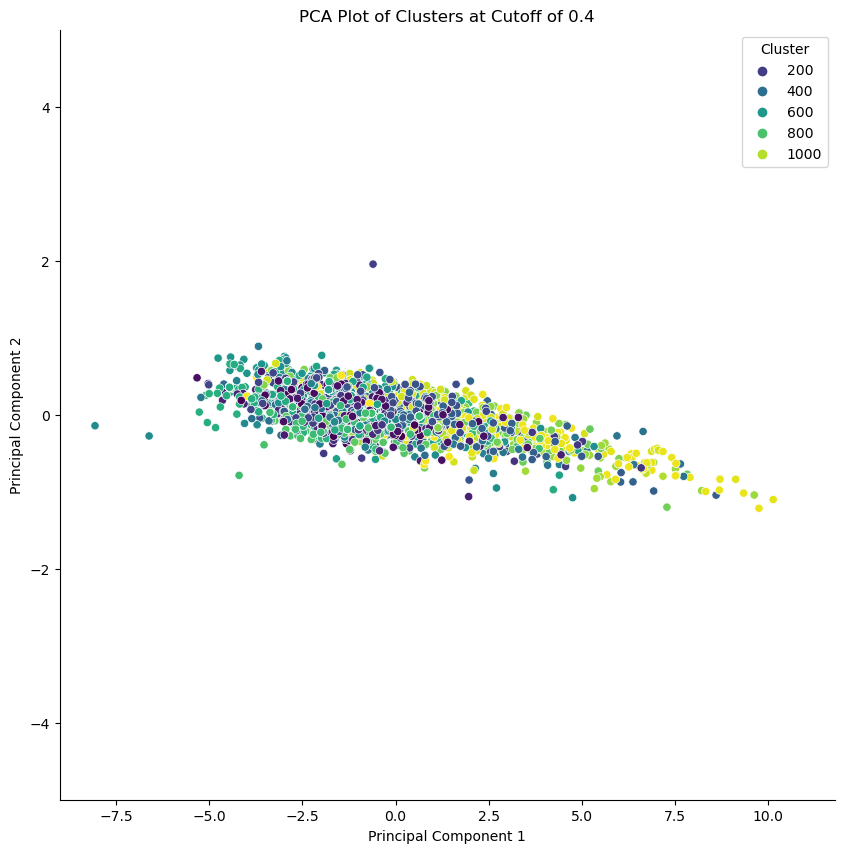

In [51]:
# quick PCA
# Reduce dimensions
pca = PCA(n_components=2)
principal_components = pca.fit_transform(combined_scaled_encoded)

# Plot
plt.figure(figsize=(10, 10))
sns.scatterplot(x=principal_components[:, 0], y=principal_components[:, 1], hue=cluster_df['cluster'], palette='viridis')
plt.title('PCA Plot of Clusters at Cutoff of 0.4')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.ylim(-5, 5)  # Set y-axis limit
plt.legend(title='Cluster')
# Remove the plot frame
ax = plt.gca()  # Get the current axes
ax.spines['top'].set_visible(False)  # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine
plt.show()


#### hierachical dendrogram at relative cutoff of 0.4

In [52]:
# Define linkage_matrix and compute cluster labels
def plot_dendrogram_at_cutoff(linkage_matrix, cutoff_distance):
    cluster_labels = fcluster(linkage_matrix, cutoff_distance, criterion='distance')
    
    # Generate a color palette
    palette = sns.color_palette("husl", len(set(cluster_labels)))
    
    # Create a color mapping based on cluster membership from fcluster
    leaf_colors = {i: palette[label - 1] for i, label in enumerate(cluster_labels)}
    
    # Dendrogram plotting with colors specified per leaf
    plt.figure(figsize=(48, 12))
    dendrogram(linkage_matrix, color_threshold=cutoff_distance,
               leaf_label_func=lambda x: leaf_colors[x])
    plt.title(f'Agglomerative Clustering Dendrogram of EcoCrop Crops at Cutoff {cutoff_distance}')
    plt.xlabel('Sample index')
    plt.ylabel('Distance')
    
    # Remove plot frame
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    ax.xaxis.set_visible(False)  # Hide the entire x-axis
    ax.spines['bottom'].set_visible(False)  # Hide the bottom spine
    
    # Remove y-axis domain line
    ax.spines['left'].set_visible(False)  # Hide the left spine
    
    return plt.show()

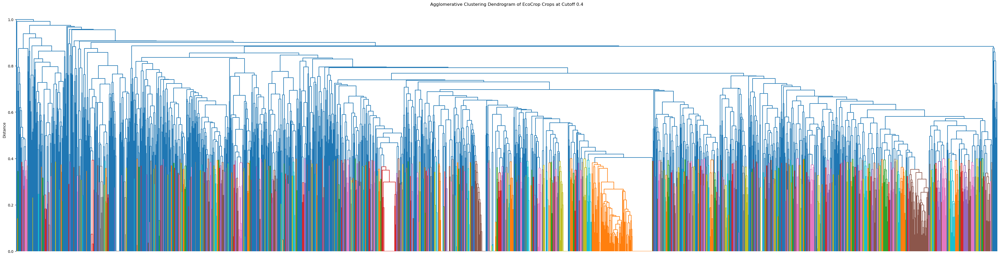

In [53]:
cutoff_distance = 0.4
plot_dendrogram_at_cutoff(Z, cutoff_distance)

#### interactive hierarchical dendrogram of clusters at cutoff 0.4

based on 

https://altair-viz.github.io/gallery/dendrogram.html

which is based on 

https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html

In [54]:
warnings.filterwarnings("ignore", category=FutureWarning)

def get_leaf_loc(den):
    """
    Get the location of the leaves
    """
    _from = int(np.array(den["icoord"]).min())
    _to = int(np.array(den["icoord"]).max() + 1)
    return range(_from, _to, 10)

def get_df_coord(den):
    """
    Get coordinate dataframe.
    """
    cols_xk = ["xk1", "xk2", "xk3", "xk4"]
    cols_yk = ["yk1", "yk2", "yk3", "yk4"]

    df_coord = pd.merge(
        pd.DataFrame(den["icoord"], columns=cols_xk),
        pd.DataFrame(den["dcoord"], columns=cols_yk),
        left_index=True,
        right_index=True
    )
    return df_coord
def generate_interactive_dendrogram_colored_by_cluster(df, linkage_matrix, cutoff_distance):
    # Define linkage_matrix and compute cluster labels
    # cutoff_distance = 70
    cluster_labels = fcluster(linkage_matrix, cutoff_distance, criterion='distance')
    
    # Generate a color palette
    palette = sns.color_palette("husl", len(set(cluster_labels)))
    
    # Map cluster labels to colors
    color_map = {label: f'rgb({int(rgb[0]*255)}, {int(rgb[1]*255)}, {int(rgb[2]*255)})' for label, rgb in zip(set(cluster_labels), palette)}
    
    # Generate dendrogram data without plotting to extract the structure
    den = dendrogram(
        linkage_matrix, 
        color_threshold=0.7, 
        no_plot=True
    )
    
    # Adjust the color assignment by correctly indexing the cluster_labels
    source = get_df_coord(den)
    source['color'] = [color_map[cluster_labels[den['leaves'][i]]] for i in range(len(den['dcoord']))]
    
    # Include the cluster labels
    source['cluster'] = [cluster_labels[i] for i in den['leaves'][:-1]]
    # Include Genus species information
    source['genus_species'] = [df.iloc[i]['genus_species'] for i in den['leaves'][:-1]]
    
    chart_width = 1200
    chart_height = 400
    
    base = alt.Chart(
        source,
        width=chart_width,
        height=chart_height
    )
    
    # the U shape is composed of a shoulder plus two arms
    shoulder = base.mark_rule().encode(
        alt.X("xk2:Q", title="Crop",  axis=alt.Axis(titleAnchor='start', grid=False, domain=False, ticks=False, labels=False)),
        alt.X2("xk3:Q"),
        alt.Y("yk2:Q", title="Distance", axis=alt.Axis(
            grid=False, 
            domain=False, 
            # ticks=False,
            offset=20,
            titlePadding=10,
        )
             ),
        alt.Color('cluster:N', legend=None),
        tooltip=['cluster:N', 'genus_species']
    )
    arm1 = base.mark_rule().encode(
        alt.X("xk1:Q"),
        alt.Y("yk1:Q"),
        alt.Y2("yk2:Q"),
        alt.Color('cluster:N', legend=None),
         tooltip=['cluster:N', 'genus_species']
    )
    arm2 = base.mark_rule().encode(
        alt.X("xk3:Q"),
        alt.Y("yk3:Q"),
        alt.Y2("yk4:Q"),
        alt.Color('cluster:N', legend=None),
        tooltip=['cluster:N', 'genus_species']
    )
    
    plot_dendrogram = (shoulder + arm1 + arm2).interactive(bind_x=True, bind_y=False)
    
    base_text = alt.Chart(
        source
    ).encode(
        color='cluster:N',
        tooltip = alt.Tooltip(['cluster:N', "genus_species:N"])
    ).mark_tick(
        dy=0, 
        angle=0, 
        align="center", 
        thickness=3, 
        # color='grey', 
        strokeOpacity=0.25
    )
    
    text1 = base_text.encode(
        x = alt.X("xk1:Q", axis=None),
    )

    text2 = base_text.encode(
        x = alt.X("xk3:Q", axis=None),
    )

    # plot_text = alt.LayerChart(text1,text2)
    plot_text = text1 + text2
    
    # final_plot = (plot_dendrogram & plot_text)
    final_plot = plot_dendrogram
    
    final_plot.resolve_scale(
        x="shared"
    ).configure(
        padding={"top":10,"left":10}
    ).configure_concat(
        spacing=0
    ).configure_axis(
        # labels=False,
        # ticks=False,
        grid=False
    ).properties(
        title=[f"Hierarchical Clustering Dendrogram of EcoCrop Crops: Clusters at a Cutoff of {cutoff_distance}"]
    ).configure_view(strokeOpacity=0)
    
    return final_plot

In [55]:
cutoff_distance = 0.4
generate_interactive_dendrogram_colored_by_cluster(cluster_df, Z, cutoff_distance)
# cluster_df

alt.LayerChart(...)

In [56]:
cluster_767 = cluster_df[cluster_df['cluster']==767]
cluster_767
# cluster_df['cluster']
# [display(pd.DataFrame(cluster_767.iloc[i]).T) for i in range(len(cluster_767))]

,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8,x,cluster
56,536,Brachiaria brizantha,grass,erect,perennial,multi stem,"forage/pasture, ornamentals/turf, environmental",grown on small scale,25.000000,35.000000,...,1032,909,767,634,479,245,106,34,767,767
57,537,Brachiaria decumbens,grass,erect,perennial,multi stem,forage/pasture,grown on large scale,25.000000,35.000000,...,1034,910,767,634,479,245,106,34,767,767
59,539,Brachiaria miliiformis,grass,erect,"annual, perennial",multi stem,forage/pasture,grown on small scale,24.000000,30.000000,...,1036,911,767,634,479,245,106,34,767,767
645,2921,Agropyron desertorum,grass,erect,perennial,multi stem,"forage/pasture, environmental",grown on small scale,15.000000,20.000000,...,1034,910,767,634,479,245,106,34,767,767
652,2929,Agropyron spicatum,grass,erect,perennial,multi stem,forage/pasture,grown on small scale,12.000000,20.000000,...,1034,910,767,634,479,245,106,34,767,767
757,3387,Arrhenatherum elatius,grass,erect,perennial,multi stem,forage/pasture,grown on small scale,14.000000,25.000000,...,1034,910,767,634,479,245,106,34,767,767
854,3796,Bouteloua curtipendula,grass,erect,perennial,multi stem,forage/pasture,grown on small scale,13.000000,22.000000,...,1033,909,767,634,479,245,106,34,767,767
856,3803,Brachiaria deflexa,grass,erect,perennial,multi stem,forage/pasture,grown on small scale,24.555556,31.888889,...,1034,910,767,634,479,245,106,34,767,767
858,3807,Brachiaria jubata,grass,erect,perennial,multi stem,forage/pasture,grown on small scale,24.555556,31.888889,...,1034,910,767,634,479,245,106,34,767,767
896,4042,Calliandra calothyrsus,"shrub, tree",erect,perennial,"evergreen, deciduous","forage/pasture, materials, ornamentals/turf, f...",grown on small scale,22.000000,30.000000,...,1034,910,767,634,479,245,106,34,767,767


In [57]:
cluster_df[cluster_df['cluster']==1070]

,crop_code,genus_species,Life.form,Habit,Life.span,Physiology,Category,Plant.attributes,temp_opt_min,Temp_Opt_Max,...,clusters_at_cutoff_0.3,clusters_at_cutoff_0.35,clusters_at_cutoff_0.4,clusters_at_cutoff_0.45,clusters_at_cutoff_0.5,clusters_at_cutoff_0.6,clusters_at_cutoff_0.7,clusters_at_cutoff_0.8,x,cluster
612,2770,Acmena smithii,tree,erect,perennial,single stem,"forest/wood, environmental",grown on small scale,18.0,28.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
710,3222,Angophora floribunda,tree,erect,perennial,single stem,"forage/pasture, forest/wood, environmental",grown on small scale,18.0,30.0,...,1556,1322,1070,846,622,288,115,34,1070,1070
742,3356,Argyrodendron actinophyllum,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,28.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
1063,4992,Cryptocarya erythroxylon,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,28.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
1144,5485,Diploglottis cunninghamii,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,28.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
1154,5531,Doryphora sassafras,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,28.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
1159,5588,Dysoxylum fraseranum,tree,erect,perennial,single stem,"ornamentals/turf, forest/wood, environmental",grown on small scale,20.0,28.0,...,1558,1323,1070,846,622,288,115,34,1070,1070
1202,5832,Eucalyptus agglomerata,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,28.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
1203,5833,Eucalyptus albens,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,30.0,...,1559,1323,1070,846,622,288,115,34,1070,1070
1204,5834,Eucalyptus astringens,tree,erect,perennial,single stem,forest/wood,grown on small scale,18.0,28.0,...,1556,1322,1070,846,622,288,115,34,1070,1070


#### distribution of of cluster sizes at relative cutoff of 0.4

In [58]:
def plot_cluster_sizes_at_cuttof(df, cutoff):
    
    cluster = f'clusters_at_cutoff_{cutoff}'
    cluster_sizes = df.groupby(cluster).size()
    
    # Plotting the distribution of cluster sizes
    plt.figure(figsize=(10, 6))
    sns.histplot(cluster_sizes, bins=100, kde=True, color='skyblue', 
                 edgecolor='skyblue', alpha=0.5,
                 line_kws={'color': 'red', 'lw': 2})  # Correct parameter for KDE line customization
    
    plt.title(f'Distribution of cluster sizes at relative cutoff of {cutoff}')
    plt.xlabel(f'Cluster size at relative cutoff {cutoff}')
    plt.ylabel('Frequency')
    
    # Remove the plot frame
    ax = plt.gca()  # Get the current axes
    ax.spines['top'].set_visible(False)  # Remove the top spine
    ax.spines['right'].set_visible(False)  # Remove the right spine
    
    plt.show()

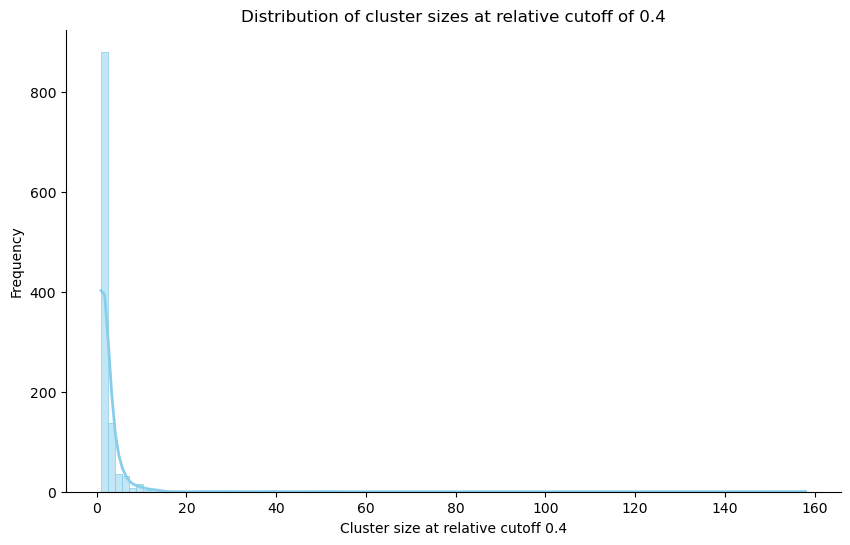

In [59]:
df = cluster_df
cutoff = 0.4
plot_cluster_sizes_at_cuttof(df, cutoff)

### comparison of clusters at different distance cutoffs

#### cutoff_distance = 0.1

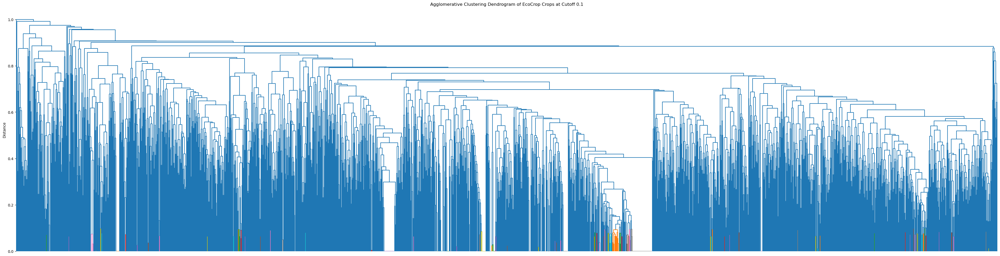

In [60]:
cutoff_distance = 0.1
plot_dendrogram_at_cutoff(Z, cutoff_distance)

#### cutoff_distance = 0.2

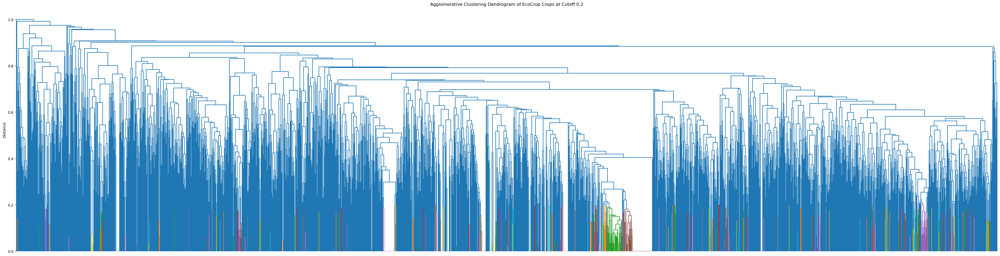

In [61]:
cutoff_distance = 0.2
plot_dendrogram_at_cutoff(Z, cutoff_distance)

#### cutoff_distance = 0.4

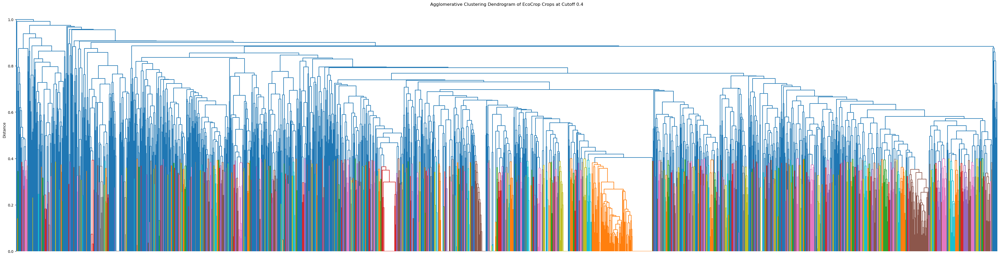

In [62]:
cutoff_distance = 0.4
plot_dendrogram_at_cutoff(Z, cutoff_distance)

#### cutoff_distance = 0.6

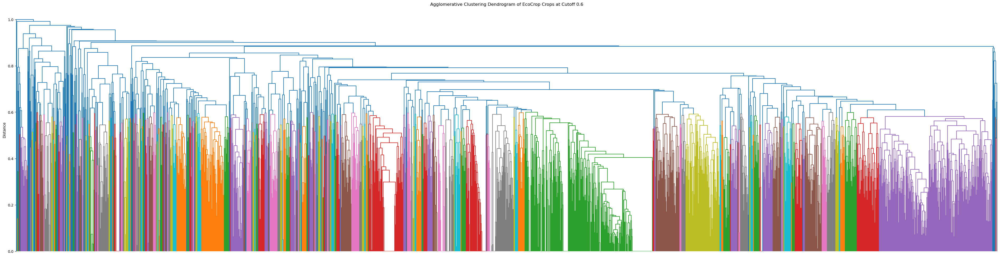

In [63]:
cutoff_distance = 0.6
plot_dendrogram_at_cutoff(Z, cutoff_distance)

### evaluation metrics at relative cutoff = 0.4

In [64]:
cutoff = 0.4
clusters = f'clusters_at_cutoff_{cutoff}'
cluster_labels = cluster_df[clusters]
cluster_df['cluster'] = cluster_df[clusters]

#### 1. Silhouette Score


The silhouette score measures how similar an object is to its own cluster compared to other clusters. The score ranges from -1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

- **High positive values** indicate that samples are well clustered.
- **Values near zero** suggest overlapping clusters.
- **Negative values** generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar.

Note that members of the same cluster do not necessarily have the same silhouette score. Silhouette scores measure how similar an individual data point is to its own cluster compared to other clusters, and this score can vary significantly within the same cluster depending on the data point's proximity to the cluster center and to other clusters.

In [65]:
silhouette_avg = silhouette_score(gower_matrix, cluster_labels)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.05768058


##### Silhouette Values Distribution: 

The distribution of silhouette scores (both overall and per cluster) can provide insights into how well-separated and cohesive the clusters are. Scores close to +1 suggest well-separated and cohesive clusters, scores around 0 indicate overlapping clusters, and scores below 0 suggest incorrect clustering.

In [66]:
silhouette_values = silhouette_samples(gower_matrix, cluster_labels)

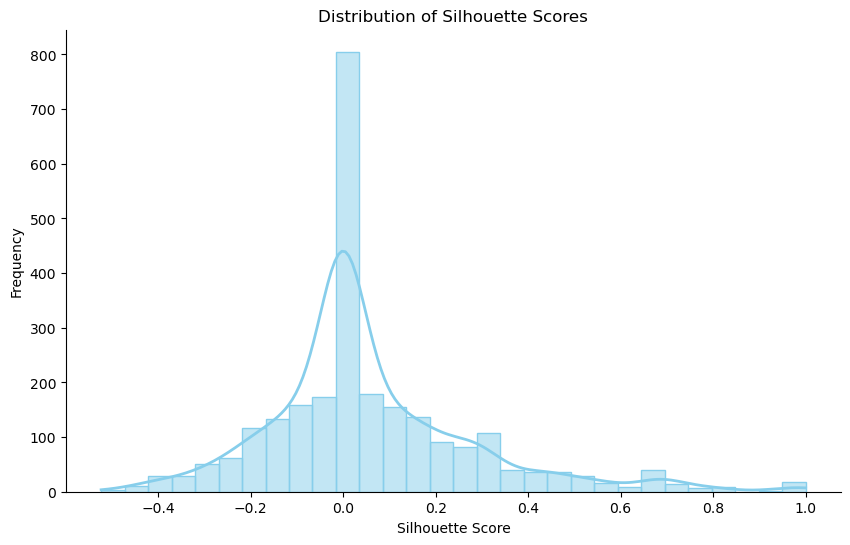

In [67]:
# Plotting the distribution of silhouette scores
plt.figure(figsize=(10, 6))
sns.histplot(silhouette_values, bins=30, kde=True, color='skyblue', 
             edgecolor='skyblue', alpha=0.5,
             line_kws={'color': 'red', 'lw': 2})  # Correct parameter for KDE line customization

plt.title('Distribution of Silhouette Scores')
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')

# Remove the plot frame
ax = plt.gca()  # Get the current axes
ax.spines['top'].set_visible(False)  # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine

plt.show()


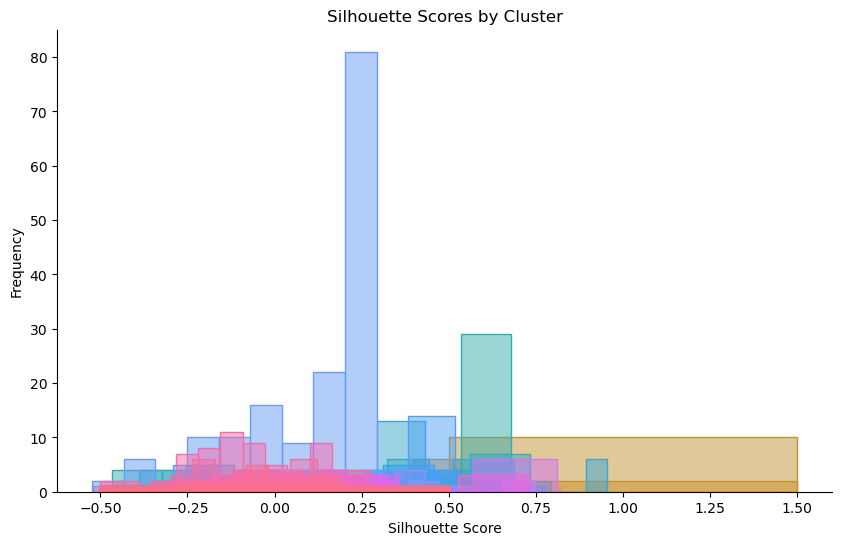

In [68]:
# silhouette score distribution per cluster
# Set the color palette
palette = sns.color_palette("husl", n_colors=len(set(cluster_labels)))

plt.figure(figsize=(10, 6))
for i, color in zip(set(cluster_labels), palette):
    # Plot histogram for each cluster with specified edge color
    sns.histplot(silhouette_values[cluster_labels == i], label=f'Cluster {i}', color=color, edgecolor=color, alpha=0.5)
plt.title('Silhouette Scores by Cluster')
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')

# Remove the plot frame
ax = plt.gca()  # Get the current axes
ax.spines['top'].set_visible(False)  # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine

# plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position outside the plot
plt.show()


In [69]:
silhouette_col_name = f'cluster_silhouette_score_at_cutoff_{cutoff}'
cluster_df[silhouette_col_name] = silhouette_values
silhouette_col_name

'cluster_silhouette_score_at_cutoff_0.4'

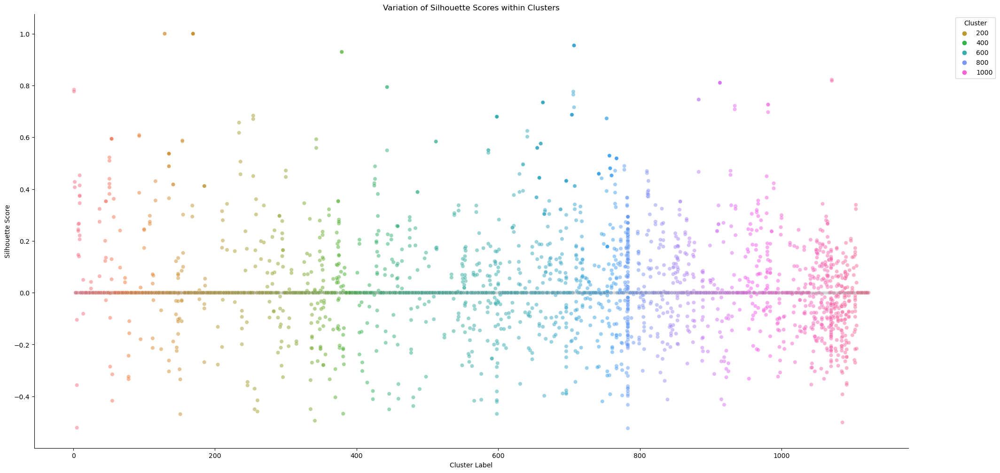

In [70]:
# examine varability of silhouette scores within each cluster
plt.figure(figsize=(24, 12))

# Create a scatter plot with points colored by 'cluster' label
ax = sns.scatterplot(x='cluster', y='cluster_silhouette_score_at_cutoff_0.4', data=cluster_df, hue='cluster', palette='husl', alpha=0.5)
# ax = sns.boxplot(x='cluster', y='cluster_silhouette_score', data=clusters_at_cutoff_70)

plt.title('Variation of Silhouette Scores within Clusters')
plt.xlabel('Cluster Label')
plt.ylabel('Silhouette Score')

# Add tick marks at y=0 for each cluster
unique_clusters = cluster_df['cluster'].unique()
for cluster in unique_clusters:
    plt.plot([cluster, cluster], [0, 0], marker='|', markersize=5, color="gray", alpha=0.2)

# # Adjust x-ticks to show each cluster label
# ax.set_xticks(unique_clusters)  # Set x-ticks to cluster labels
# ax.set_xticklabels(unique_clusters)  # Set x-tick labels to cluster labels

# Improve visibility of zero-line across the plot
# plt.axhline(0, color='lightgrey', linestyle='--', linewidth=1)  # Adds a horizontal line at y=0

# Remove the plot frame
ax.spines['top'].set_visible(False)  # Remove the top spine
ax.spines['right'].set_visible(False)  # Remove the right spine

plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position
plt.show()


#### 2. Davies-Bouldin Index

This index signifies the average 'similarity' between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves. A lower Davies-Bouldin index relates to a model with better separation between the clusters.

In [71]:
db_index = davies_bouldin_score(combined_scaled_encoded, cluster_labels)
print("Davies-Bouldin Index: ", db_index)

Davies-Bouldin Index:  1.317614516670738


#### 3. Calinski-Harabasz Index (Variance Ratio Criterion)
 
This index is the ratio of the sum of between-clusters dispersion and of within-cluster dispersion for all clusters (where dispersion is defined as the sum of distances squared). Higher values generally mean that the clusters are dense and well separated, which is typically viewed as better.

In [72]:
ch_index = calinski_harabasz_score(combined_scaled_encoded, cluster_labels)
print("Calinski-Harabasz Index: ", ch_index)

Calinski-Harabasz Index:  5.312153988462484


## feature importance

In [73]:
categorical_data.columns

Index(['Life.form', 'Habit', 'Life.span', 'Physiology', 'Category',
       'Plant.attributes', 'Light_Opt_Min', 'Light_Opt_Max', 'Light_Abs_Min',
       'Light_Abs_Max', 'Depth_Opt', 'Depth_Abs', 'Texture_Ops', 'Texture_Abs',
       'Fertility_Ops', 'Fertility_Abs', 'Al_Toxicity_Opt', 'Al_Toxicity_Abs',
       'Salinity_Ops', 'Salinity_Abs', 'drainage_opt', 'drainage_abs',
       'Climate.Zone', 'photoperiod', 'Abiotic.toler.', 'Abiotic.suscept.'],
      dtype='object')

In [74]:
numeric_data.columns

Index(['temp_opt_min', 'Temp_Opt_Max', 'Temp_Abs_Min', 'Temp_Abs_Max',
       'Rain_Opt_Min', 'Rain_Opt_Max', 'Rain_Abs_Min', 'Rain_Abs_Max',
       'Lat_Opt_Min', 'Lat_Opt_Max', 'Lat_Abs_Min', 'Lat_Abs_Max',
       'Alt_Abs_Min', 'Alt_Abs_Max', 'pH_Opt_Min', 'pH_Opt_Max', 'pH_Abs_Min',
       'pH_Abs_Max', 'Killing.temp..during.rest', 'Killing.temp..early.growth',
       'cycle_min', 'cycle_max'],
      dtype='object')

In [75]:
len(categorical_data.columns), len(numeric_data.columns), len(df_for_clustering.columns)

(26, 22, 48)

In [76]:
categorical_features = categorical_data.columns 
numeric_features =  numeric_data.columns
# numeric_features, categorical_features
df_for_clustering.columns

Index(['Life.form', 'Habit', 'Life.span', 'Physiology', 'Category',
       'Plant.attributes', 'temp_opt_min', 'Temp_Opt_Max', 'Temp_Abs_Min',
       'Temp_Abs_Max', 'Rain_Opt_Min', 'Rain_Opt_Max', 'Rain_Abs_Min',
       'Rain_Abs_Max', 'Lat_Opt_Min', 'Lat_Opt_Max', 'Lat_Abs_Min',
       'Lat_Abs_Max', 'Alt_Abs_Min', 'Alt_Abs_Max', 'pH_Opt_Min', 'pH_Opt_Max',
       'pH_Abs_Min', 'pH_Abs_Max', 'Light_Opt_Min', 'Light_Opt_Max',
       'Light_Abs_Min', 'Light_Abs_Max', 'Depth_Opt', 'Depth_Abs',
       'Texture_Ops', 'Texture_Abs', 'Fertility_Ops', 'Fertility_Abs',
       'Al_Toxicity_Opt', 'Al_Toxicity_Abs', 'Salinity_Ops', 'Salinity_Abs',
       'drainage_opt', 'drainage_abs', 'Climate.Zone', 'photoperiod',
       'Killing.temp..during.rest', 'Killing.temp..early.growth',
       'Abiotic.toler.', 'Abiotic.suscept.', 'cycle_min', 'cycle_max'],
      dtype='object')

In [125]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Sample data preparation
df_for_clustering = cropbasics_clean_df[columns_to_keep].copy()

categorical_data = df_for_clustering.select_dtypes(include='object')
numeric_data = df_for_clustering.select_dtypes(include='number')

categorical_features = categorical_data.columns.tolist()
numeric_features = numeric_data.columns.tolist()

X = df_for_clustering.copy()
y = cluster_df['clusters_at_cutoff_0.4']

# Step 1: Preprocessing Pipelines
# One-Hot Encoding for categorical features
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Standard Scaling for numeric features
numeric_transformer = StandardScaler()

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Step 2: Create a Pipeline with Preprocessor and RandomForestClassifier
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

# Step 3: Fit the Pipeline
# Use the cluster labels obtained from agglomerative clustering as the target variable
rf_pipeline.fit(X, y)

# Step 4: Extract Feature Importances
# Get feature names after preprocessing
feature_names = numeric_features + list(rf_pipeline.named_steps['preprocessor']
                                       .named_transformers_['cat']
                                       .get_feature_names_out(categorical_features))

# Get feature importances from the classifier
importances = rf_pipeline.named_steps['classifier'].feature_importances_
feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})

# Sort features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)
# print(feature_importances)
feature_importances
for feature in feature_importances['feature'][:50]:
    print(feature)

Rain_Opt_Max
Rain_Abs_Min
Rain_Abs_Max
Lat_Abs_Min
Rain_Opt_Min
Lat_Abs_Max
Alt_Abs_Max
temp_opt_min
Temp_Abs_Max
Temp_Opt_Max
Temp_Abs_Min
cycle_min
Lat_Opt_Min
Lat_Opt_Max
pH_Abs_Min
pH_Abs_Max
pH_Opt_Max
cycle_max
pH_Opt_Min
Alt_Abs_Min
Killing.temp..during.rest
Killing.temp..early.growth
Texture_Ops_medium, light
Texture_Abs_heavy, medium, light
Light_Abs_Max_cloudy skies
Light_Opt_Max_very bright
drainage_abs_well (dry spells)
Depth_Opt_medium (50-150 cm)
Fertility_Ops_moderate
Plant.attributes_grown on small scale
Fertility_Abs_low
drainage_abs_well (dry spells), excessive (dry/moderately dry)
photoperiod_short day (<12 hours)
Fertility_Abs_moderate
Depth_Abs_shallow (20-50 cm)
photoperiod_short day (<12 hours), neutral day (12-14 hours), long day (>14 hours)
Fertility_Ops_high
Light_Opt_Max_clear skies
Texture_Abs_medium, light
Physiology_multi stem
Abiotic.toler._drought
Depth_Opt_deep (>>150 cm)
drainage_abs_poorly (saturated >50% of year), well (dry spells)
Depth_Abs_medium (

In [218]:
titleFontSize = 14

# Sort the feature importances DataFrame by importance
# feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# # Create the plot
# feature_importance_plot = alt.Chart(
#     feature_importances
# ).encode(
#     y=alt.Y('feature:N', sort='-x'),  # Sort the y-axis by the importance values
#     x='importance:Q'
# ).mark_bar()


# Sort the feature importances DataFrame by importance and select the top 50
top_features = feature_importances.sort_values(by='importance', ascending=False).head(50)

# Create the plot for the top 50 features
feature_importance_plot = alt.Chart(
    top_features
).encode(
    y=alt.Y('feature:N', sort='-x', title='Feature', axis=alt.Axis(titleFontSize=titleFontSize, titleAnchor='start', titleAngle=0, titleX=-60, titleY = -5, offset=10)),  # Sort the y-axis by the importance values
    x=alt.X('importance:Q', title='Feature Importance', axis=alt.Axis(titleFontSize=titleFontSize, orient='top', titleAnchor='start', titleY=-30, offset=10))  # Place x-axis at the top
).mark_bar(
    opacity=0.8,
    color='cornflowerblue'
)

# Display the plot
feature_importance_plot

alt.Chart(...)

## subtraction analysis

### remove one feature at a time

In [226]:
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import gower
import altair as alt
from scipy.cluster.hierarchy import fcluster

# Define your function to generate the linkage matrix from AgglomerativeClustering
def generate_linkage_matrix_from_agg_clust(agg_clust):
    counts = np.zeros(agg_clust.children_.shape[0])
    n_samples = len(agg_clust.labels_)
    for i, merge in enumerate(agg_clust.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    
    linkage_matrix = np.column_stack([agg_clust.children_, agg_clust.distances_, counts]).astype(float)
    
    Z = linkage_matrix.copy()
    Z[:, 2] = Z[:, 2] / Z[:, 2].max()
    return Z

# Ensure to install the gower package if not already installed
# !pip install gower

# Prepare the initial data
df_for_clustering = cropbasics_clean_df[columns_to_keep].copy()
categorical_data = df_for_clustering.select_dtypes(include='object')
numeric_data = df_for_clustering.select_dtypes(include='number')

# Encode and scale initial data
categorical_encoded = pd.get_dummies(categorical_data, drop_first=True)
scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric_data)
combined_scaled_encoded = np.hstack((numeric_scaled, categorical_encoded.values))

# # Assume feature_importances DataFrame is already sorted and contains the top 50 features
# top_features = feature_importances.head(50).copy()
# # dummy_row = pd.DataFrame(feature_importances.iloc[0]).T
# dummy_row = pd.DataFrame({'feature': ['No Features Removed'], 'importance': [top_features['importance'].max()]})
# # top_features = top_features['feature'].sort_values(by='importance', ascending=False)
# top_features = dummy_row.append(top_features)
# top_features = top_features['feature'].to_list()
# # dummy_row
# # top_features

top_features = feature_importances.sort_values(by='importance', ascending=False).head(50).copy()
top_features = top_features['feature'].to_list()
top_features = ['No Feature Removed'] +  top_features
# top_features

# DataFrame to store silhouette scores
silhouette_scores = []

# Define your custom distance cutoff for clustering
custom_cutoff_distance = 0.4  # Adjust this value as needed

for feature in top_features:
# for feature in top_features[:3]:
    # Remove the feature from the feature set
    if feature in numeric_data.columns:
        numeric_subset = numeric_data.drop(columns=[feature])
        categorical_subset = categorical_data
    elif feature in categorical_data.columns:
        numeric_subset = numeric_data
        categorical_subset = categorical_data.drop(columns=[feature])
    else:
        categorical_subset = categorical_data
        numeric_subset = numeric_data

    # Encode and scale the subset of data
    categorical_encoded_subset = pd.get_dummies(categorical_subset, drop_first=True)
    numeric_scaled_subset = scaler.fit_transform(numeric_subset)
    combined_scaled_encoded_subset = np.hstack((numeric_scaled_subset, categorical_encoded_subset.values))
    
    # Calculate Gower's distance matrix for the subset
    gower_dist_matrix_subset = gower.gower_matrix(combined_scaled_encoded_subset)
    
    # Perform agglomerative clustering using the distance matrix
    ac = AgglomerativeClustering(affinity='precomputed', linkage='average', distance_threshold=0, n_clusters=None)
    ac.fit(gower_dist_matrix_subset)
    
    # Generate the linkage matrix
    Z = generate_linkage_matrix_from_agg_clust(ac)
    
    # Get cluster labels using the custom cutoff distance
    cluster_labels = fcluster(Z, t=custom_cutoff_distance, criterion='distance')
    
    # Calculate silhouette score
    score = silhouette_score(gower_dist_matrix_subset, cluster_labels, metric='precomputed')
    
    # Append the result
    silhouette_scores.append({'feature': feature, 'silhouette_score': score})

# Convert the results to a DataFrame
silhouette_scores_df = pd.DataFrame(silhouette_scores)

In [227]:
silhouette_scores_df

,feature,silhouette_score
0,No Feature Removed,0.189721
1,Rain_Opt_Max,0.185418
2,Rain_Abs_Min,0.184963
3,Rain_Abs_Max,0.188065
4,Lat_Abs_Min,0.190428
5,Rain_Opt_Min,0.188206
6,Lat_Abs_Max,0.190059
7,Alt_Abs_Max,0.181709
8,temp_opt_min,0.189718
9,Temp_Abs_Max,0.189721


In [228]:
# Sort by feature importance (as in the original importance order)
silhouette_scores_df['feature'] = pd.Categorical(silhouette_scores_df['feature'], categories=top_features, ordered=True)
silhouette_scores_df = silhouette_scores_df.sort_values(by='feature')

# Plot the silhouette scores
silhouette_score_plot = alt.Chart(
    silhouette_scores_df
).encode(
    y=alt.Y('feature:N', sort=None, title='Feature Removed', axis=alt.Axis(titleFontSize=titleFontSize, titleAnchor='start', titleAngle=0, titleX=-120, titleY = -5, offset=10)),  
    x=alt.X('silhouette_score:Q', title='Silhouette Score', axis=alt.Axis(titleFontSize=titleFontSize, orient='top', titleAnchor='start', offset=10)),
    tooltip=[
        alt.Tooltip('feature', title='Feature Removed'), 
        alt.Tooltip('silhouette_score:Q', title='Silhouette Score', format='.3f'),
    ]
).mark_bar(
    opacity=0.8,
    color='cornflowerblue'
)

# Display the plot
silhouette_score_plot

alt.Chart(...)

###  iteratively exclude increasing numbers of the top features

In [229]:
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import gower
import altair as alt
from scipy.cluster.hierarchy import fcluster

# Define your function to generate the linkage matrix from AgglomerativeClustering
def generate_linkage_matrix_from_agg_clust(agg_clust):
    counts = np.zeros(agg_clust.children_.shape[0])
    n_samples = len(agg_clust.labels_)
    for i, merge in enumerate(agg_clust.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    
    linkage_matrix = np.column_stack([agg_clust.children_, agg_clust.distances_, counts]).astype(float)
    
    Z = linkage_matrix.copy()
    Z[:, 2] = Z[:, 2] / Z[:, 2].max()
    return Z

# Ensure to install the gower package if not already installed
# !pip install gower

# Prepare the initial data
df_for_clustering = cropbasics_clean_df[columns_to_keep].copy()
categorical_data = df_for_clustering.select_dtypes(include='object')
numeric_data = df_for_clustering.select_dtypes(include='number')

# Encode and scale initial data
categorical_encoded = pd.get_dummies(categorical_data, drop_first=True)
scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric_data)
combined_scaled_encoded = np.hstack((numeric_scaled, categorical_encoded.values))

# Assume feature_importances DataFrame is already sorted and contains the top 50 features
top_features = feature_importances.head(50)['feature'].tolist()

# DataFrame to store silhouette scores
silhouette_scores = []

# Define your custom distance cutoff for clustering
custom_cutoff_distance = 0.4  # Adjust this value as needed

for i in range(len(top_features) + 1):
# for i in range(3):
    features_to_use = top_features[:i]
    
    # Remove the selected features from the feature set
    numeric_subset = numeric_data.drop(columns=[f for f in features_to_use if f in numeric_data.columns], errors='ignore')
    categorical_subset = categorical_data.drop(columns=[f for f in features_to_use if f in categorical_data.columns], errors='ignore')

    # Encode and scale the subset of data
    categorical_encoded_subset = pd.get_dummies(categorical_subset, drop_first=True)
    if not numeric_subset.empty:
        numeric_scaled_subset = scaler.fit_transform(numeric_subset)
    else:
        numeric_scaled_subset = np.empty((numeric_data.shape[0], 0))

    if not categorical_encoded_subset.empty:
        combined_scaled_encoded_subset = np.hstack((numeric_scaled_subset, categorical_encoded_subset.values))
    else:
        combined_scaled_encoded_subset = numeric_scaled_subset
    
    # Calculate Gower's distance matrix for the subset
    gower_dist_matrix_subset = gower.gower_matrix(combined_scaled_encoded_subset)
    
    # Perform agglomerative clustering using the distance matrix
    ac = AgglomerativeClustering(affinity='precomputed', linkage='average', distance_threshold=0, n_clusters=None)
    ac.fit(gower_dist_matrix_subset)
    
    # Generate the linkage matrix
    Z = generate_linkage_matrix_from_agg_clust(ac)
    
    # Get cluster labels using the custom cutoff distance
    cluster_labels = fcluster(Z, t=custom_cutoff_distance, criterion='distance')
    
    # Calculate silhouette score
    score = silhouette_score(gower_dist_matrix_subset, cluster_labels, metric='precomputed')
    
    # Append the result
    if i==0:
        features_to_use = 'No Features Removed'
    silhouette_scores.append({'num_features_removed': i, 'silhouette_score': score, 'removed_features': features_to_use})

# Convert the results to a DataFrame
silhouette_scores_df = pd.DataFrame(silhouette_scores)
silhouette_scores_df.head(3)

,num_features_removed,silhouette_score,removed_features
0,0,0.189721,No Features Removed
1,1,0.185418,[Rain_Opt_Max]
2,2,0.184950,"[Rain_Opt_Max, Rain_Abs_Min]"


In [234]:

# Plot the silhouette scores
width = 800
height = 400
titleFontSize=16
labelFontSize=12

silhouette_score_plot = alt.Chart(
    silhouette_scores_df,
    height=height,
    width=width
).encode(
    x=alt.X('num_features_removed:O', 
            title='Number of Features Removed',
            axis=alt.Axis(
                titleFontSize=titleFontSize,
                labelFontSize=labelFontSize,
                # titleAnchor='end', 
                # titleAngle=0, 
                # titleX=-110, 
                # titleY = -5,
                labelAngle=0,
                offset=10,
                grid=False,
            )
           ),
    y=alt.Y('silhouette_score:Q', 
            title='Silhouette Score', 
            axis=alt.Axis(
                titleFontSize=titleFontSize,
                labelFontSize=labelFontSize,
                offset=10, 
                # grid=False
            )
           ),
    tooltip=[
        alt.Tooltip('num_features_removed:O', title='Number of Features Removed'),
        alt.Tooltip('silhouette_score:Q', title='Silhouette Score', format='.3f'),
        alt.Tooltip('removed_features:N', title='Removed Features')
    ]
).mark_line(
    point=True,
    color='cornflowerblue',
# ).mark_bar(
#     color='cornflowerblue',
#     opacity=0.8,
)

# Display the plot
silhouette_score_plot

alt.Chart(...)

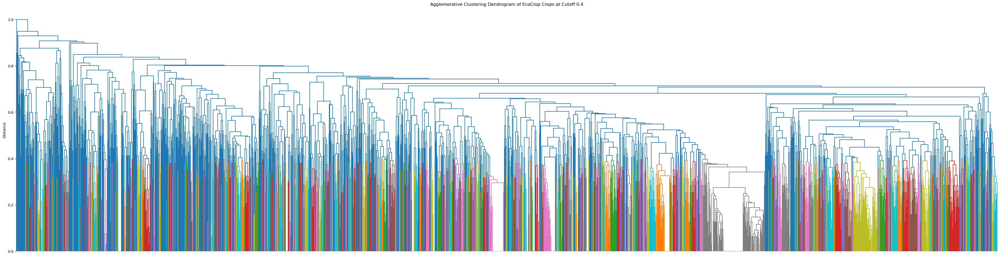

In [231]:
cutoff_distance = 0.4
plot_dendrogram_at_cutoff(Z, cutoff_distance)

In [239]:
len(np.unique(fcluster(Z, t=0.4, criterion='distance')))

910